<a href="https://colab.research.google.com/github/joseantonioochagavia/Dog-Vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## Problem

Identifying the breed of a dog given an image of a dog.

## Data

The data we're using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification/data


## Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## Features

Some information about the data:
* We're dealing with images (unstructured data) so ot's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10.000+ images in the training set (these images have labels).
* There are around 10.000+ images in the test set (These images havo no labels, we want to predict them).

In [ ]:
#!unzip '/content/drive/MyDrive/Dog Vision/dog-breed-identification (1).zip' -d 'drive/MyDrive/Dog Vision/'
# we need to do this to unzip the data into Google Drive, but now we can delete it

### Get our workspace ready

* Import TensorFlow 2.x (brcause we are dealing with unstructured data)
* Import TensorFlow Hub (to pick up a model)
* Make sure we're using a GPU

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF HUB version:', hub.__version__)

# Check for GPU availability
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

TF version: 2.11.0
TF HUB version: 0.12.0
GPU available


## Getting our data ready (turning into Tensors)

Our data needs to be in numerical format  

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

In [ ]:
# How many images are there of each breed?
labels_csv['breed'].value_counts()

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

In [ ]:
# Let's view an image
from IPython.display import Image
Image('drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ['drive/MyDrive/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]


['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check wether number of files names matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog Vision/train/')) == len(filenames):
  print('Filenames match actual amount of files!!! Proceed.')

else:
  print('Filenames do no match actual amount of files, check the target directory.')

Filenames match actual amount of files!!! Proceed.


In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
# alternative way: labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames')
else:
  print('Number of labels does not match number of filenames, check data directories')


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds # this is the same that unique_breeds == labels[0]


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # find the index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

### Creating our own validation set

since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with 1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: 'slider', min:1000, max:10000, step:1000}
# Hyperparameters (things you can set as a user) are often set in capitals

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

# Check if our data is in the same shape
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2], y_train[:2]

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image path as input.
2. Use TensorFlow to read the file and save it to a variable, image.
3. Turn our image (a jpg) in Tensors.
4. Normalize our image (convert color channel values from 0-255 to 0-1). 
5. Reasize the image to be a shape of (224, 224), to have all the images in the same shape (the size can be arbitrary)
6. Return the modified image


In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape 
# Note: the image contains pixel values between - and 225, and are a combination of Red-Green-Blue (that's why the  is 3 in the last position of the shape)

(257, 350, 3)

In [ ]:
image[:2]

In [ ]:
# Turning the numpy array to a Tensor
tf.constant(image)[:2] # note that is very siilar to th array, it changes the shape, and now it's able to run on a GPU

Let's built the function

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Tensor
  '''
  # Read in a image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Read, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values. This makes computes more efficient
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
# Note: for Deep learning, a good batch size is 32 (in this case 32 images)

## Turning our data into batches

Why turn data into batches?

Let's say you're trying to process 10.000+ images in one go...They all might not fit into memory.

So that's why we do about 32 (batch size) images at a time (you can mannualy adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
'(image, label)'.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
# demo of the funtion
get_image_label(X[42], tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our dta into tuples of Tensors, let's make a function to turn all of our data (X & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  #filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    
    # Shufling pathnames and labels before mapping image processor function is faster than shufling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visaulizing Data Batches

Our data is now in batches, however, these can be a little hard to understand, let's visualize them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

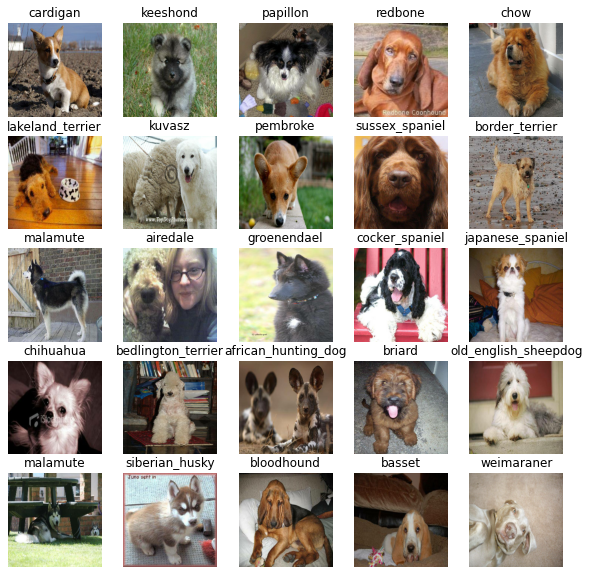

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator()) # we turn the batches into an iterator, the next is going to grab the first batch of train_data
show_25_images(train_images, train_labels)

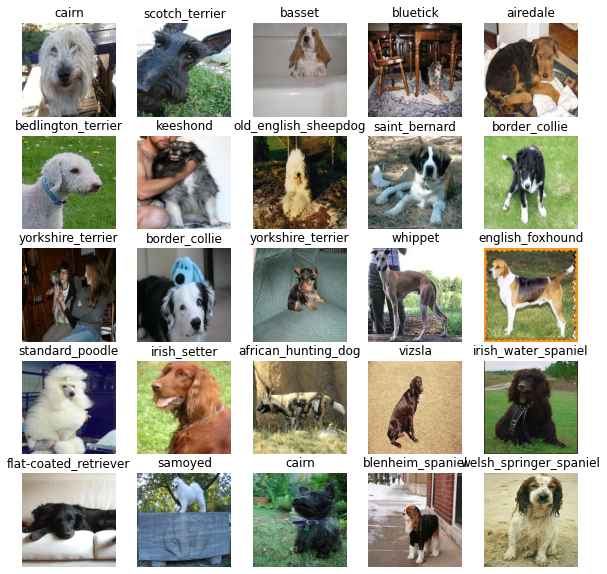

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from Tensorflow Hub - https://tfhub.dev/.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fasion (do this first, then thi, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model?hl=es-419

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers: we define how many layer we want
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax') # Layer 2 (output layer)
  ])

  # Compile the model: we define how the model is going to learn
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # the higher the loss, the worse is the model
      optimizer=tf.keras.optimizers.Adam(), # it is like a guide to helps you minimize the loss
      metrics=['accuracy'] # it is like the judge 
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model  


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Calbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track  our progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
import os

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Dog Vision/logs',
                        # Make it so the logs get tracked whenever we run experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Helps our model from overfitting training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping




In [ ]:
# Create early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, yo make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* return the model


In [ ]:
# Build a function to train and return a trained model

def train_model():
  '''
  Trains a given model and returns the trained version.
  '''

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model


In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 268s 10s/step - loss: 4.5536 - accuracy: 0.1037 - val_loss: 3.3155 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 3s 120ms/step - loss: 1.6533 - accuracy: 0.6837 - val_loss: 2.0715 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 4s 155ms/step - loss: 0.5749 - accuracy: 0.9250 - val_loss: 1.6055 - val_accuracy: 0.6550
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 0.2592 - accuracy: 0.9862 - val_loss: 1.4050 - val_accuracy: 0.7100
Epoch 5/100
25/25 [==============================] - 3s 120ms/step - loss: 0.1482 - accuracy: 0.9962 - val_loss: 1.3364 - val_accuracy: 0.7000
Epoch 6/100
25/25 [==============================] - 4s 150ms/step - loss: 0.1008 - accuracy: 1.0000 - val_loss: 1.2883 - val_accuracy: 0.7000
Epoch 7/100
25/25 [==============================

**Question:** it looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

Note: Overfitting to begin is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensotBoard magic function (%tensorboard) will access the logs directory we created erlier and visualize its contents, so we can track our experiments over time.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions


7/7 [==============================] - 1s 95ms/step


array([[1.99736399e-03, 3.46216257e-04, 9.70012043e-04, ...,
        1.14536867e-03, 3.75767959e-05, 4.31639561e-03],
       [4.13475232e-03, 7.96493201e-04, 4.62772744e-03, ...,
        9.98552889e-04, 1.53739436e-03, 4.21138451e-04],
       [1.77199363e-05, 2.96098791e-04, 9.03471664e-04, ...,
        1.31530396e-03, 1.05155748e-04, 1.02415949e-03],
       ...,
       [4.54028986e-06, 1.01658252e-05, 1.19682380e-04, ...,
        9.63415823e-06, 3.23747772e-05, 4.84664415e-05],
       [1.79832208e-03, 8.65451002e-04, 1.14222756e-04, ...,
        3.09866969e-04, 1.21930992e-04, 1.62023660e-02],
       [3.41409788e-04, 9.74183931e-05, 1.02412431e-02, ...,
        5.29590296e-03, 8.07589851e-04, 1.18175783e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0] # this is the probability of what our model thinks a certain image is

array([5.34908613e-04, 1.22967569e-04, 1.90851802e-03, 3.34549259e-05,
       1.98189024e-04, 1.25472243e-05, 6.43181754e-03, 2.05044751e-04,
       1.66871352e-04, 6.78824319e-04, 1.34305170e-04, 5.74348960e-05,
       2.01287307e-03, 1.19091652e-04, 3.42175859e-04, 2.52782862e-04,
       2.40236204e-05, 7.36568496e-02, 1.07718886e-04, 1.52810062e-05,
       4.99382906e-04, 2.00795912e-04, 2.36820470e-05, 1.95632805e-03,
       1.48593572e-05, 1.04591876e-04, 5.42480126e-02, 5.54007820e-05,
       1.68916420e-04, 1.24540893e-04, 3.73620169e-05, 5.16508066e-04,
       4.30750631e-04, 2.54346669e-05, 3.55539778e-05, 4.30042408e-02,
       1.60453910e-05, 2.33799859e-04, 1.01309270e-04, 1.29248001e-04,
       1.05297018e-03, 8.13985753e-06, 4.70888190e-04, 3.56797100e-04,
       3.99978999e-05, 1.95985078e-04, 1.49986707e-04, 3.20893741e-04,
       2.68102944e-04, 3.03607696e-04, 2.40285473e-04, 6.43591266e-05,
       3.85436579e-04, 5.27287521e-05, 8.79691725e-05, 8.11666032e-05,
      

In [ ]:
len(predictions[0])

120

In [ ]:
predictions[199]

array([4.53902030e-04, 1.47010825e-04, 2.74538225e-03, 2.05300938e-04,
       4.94949613e-03, 3.41625988e-01, 6.60035701e-04, 2.10626721e-02,
       5.62123569e-06, 2.81223631e-03, 1.62449302e-04, 1.00957295e-02,
       5.55367349e-03, 7.54498178e-04, 1.49042433e-04, 6.59255602e-04,
       1.55097283e-02, 1.68239127e-03, 8.01551912e-04, 3.18045206e-02,
       3.50168615e-04, 8.62811066e-05, 7.62649463e-04, 2.56714178e-04,
       3.44897882e-04, 8.48373893e-05, 8.82744134e-05, 1.25364751e-01,
       2.51936552e-04, 6.15067547e-04, 6.43843377e-04, 1.46908598e-04,
       1.53824745e-04, 2.17921317e-01, 2.07164834e-04, 3.38499172e-04,
       4.42767720e-04, 4.69523889e-04, 2.12456263e-03, 4.85966011e-04,
       7.58830050e-04, 3.02177435e-03, 2.73931883e-02, 8.71763099e-03,
       9.89790191e-04, 6.91453533e-06, 4.74865315e-04, 8.65586917e-04,
       5.34431383e-05, 2.06266763e-04, 2.13833191e-04, 4.08454973e-04,
       7.16838927e-04, 4.62622233e-02, 1.54225898e-04, 2.03902368e-03,
      

In [ ]:
len(predictions[199])

120

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[3.09259631e-04 6.74577139e-04 1.18767872e-04 6.63597093e-05
 3.13430885e-03 1.18871780e-04 7.51748623e-04 1.77404133e-03
 5.72411157e-03 3.41463350e-02 2.29289290e-05 1.05635881e-05
 2.55033985e-04 1.83494424e-03 6.81023637e-04 1.03552863e-02
 3.03842680e-05 7.06529478e-04 5.17845001e-05 5.60877670e-04
 3.25961919e-05 1.00303721e-03 3.13155979e-05 1.29581254e-04
 6.86538499e-03 1.55737835e-05 3.77905417e-05 1.37101786e-04
 9.57053635e-05 2.60289235e-05 3.36234043e-05 4.00215722e-05
 2.61404930e-05 4.49576546e-05 4.21160403e-05 1.04001178e-04
 2.09242557e-04 8.72816163e-05 8.22476213e-05 2.96669900e-01
 2.47499731e-04 2.33564679e-05 1.79100921e-03 3.56393480e-06
 1.72552449e-04 2.64814917e-05 5.49467572e-04 8.81814922e-04
 1.19961696e-05 6.02750224e-04 2.38684763e-04 9.05724446e-05
 8.97228820e-05 9.66750318e-04 3.10682844e-05 1.73670109e-04
 5.31568658e-05 6.93844559e-05 4.40619515e-05 7.78050089e-05
 5.82326538e-05 4.74003202e-04 8.58522162e-06 3.46127999e-05
 3.14091129e-04 2.171975

In [ ]:
# Turn prediction probabilities into their respctive label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of predictions probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label
  

'cairn'

Wonderful! Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the fit() function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

Let's make a small function to do so.

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Nailed it!

Now we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

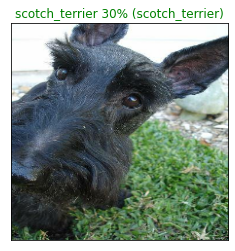

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Nice! Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using get_pred_label().
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

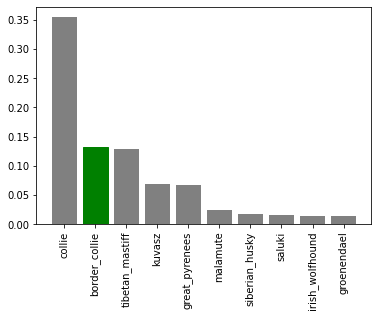

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Wonderful! Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

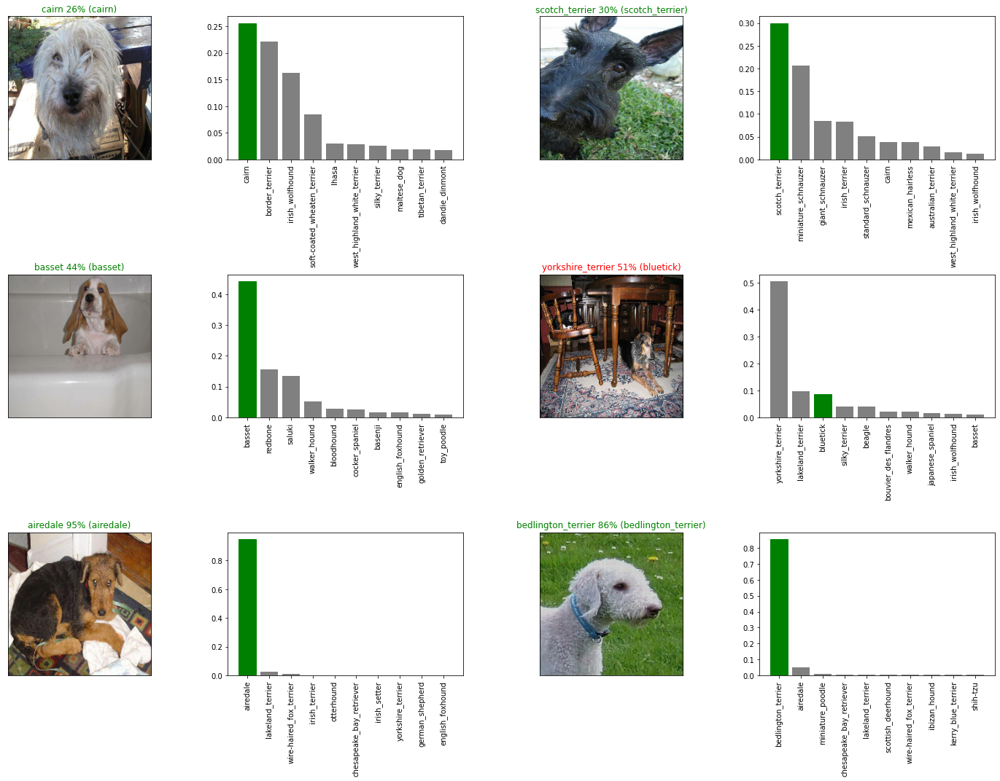

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and reloading a model

After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.

The format of an entire saved Keras model is h5 (https://www.tensorflow.org/tutorials/keras/save_and_load). So we'll make a function which can take a model as input and utilise the save() method to save it as a h5 file to a specified directory.

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

If we've got a saved model, we'd like to load it, let's create a function which can take a model path and use the tf.keras.models.load_model() function to load it into the notebook.

Because we're using a component from TensorFlow Hub (hub.KerasLayer) we'll have to pass this as a parameter to the custom_objects parameter.

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20230214-18211676398901-1000-images-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230214-18211676398901-1000-images-Adam.h5'

In [ ]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/MyDrive/Dog Vision/models/20230214-18211676398901-1000-images-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20230214-18211676398901-1000-images-Adam.h5


Compare the two models (the original one and loaded one). We can do so easily using the evaluate() method.

In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 120ms/step - loss: 1.2682 - accuracy: 0.7050


[1.2682135105133057, 0.7049999833106995]

In [ ]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 2s 108ms/step - loss: 1.2682 - accuracy: 0.7050


[1.2682135105133057, 0.7049999833106995]

### Training a model (on the full data)

Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to X and all of the training labels to y. Let's check them out.

In [ ]:
# Remind ourselves of the size of the full dataset
len(X), len(y)

(10222, 10222)

There we go! We've got over 10,000 images and labels in our training set.

Before we can train a model on these, we'll have to turn them into a data batch.

The beautiful thing is, we can use our create_data_batches() function from above which also preprocesses our images for us (thank you past us for writing a helpful function).

In [ ]:
# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating training data batches...


Our data is in a data batch, all we need now is a model.

And surprise, we've got a function for that too! Let's use create_model() to instantiate another model.

In [ ]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Since we've made a new model instance, full_model, we'll need some callbacks too.

In [ ]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

To monitor the model whilst it trains, we'll load TensorBoard (it should update every 30-seconds or so whilst the model trains).

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2158s 7s/step - loss: 1.3645 - accuracy: 0.6689
Epoch 2/100
320/320 [==============================] - 34s 107ms/step - loss: 0.3996 - accuracy: 0.8828
Epoch 3/100
320/320 [==============================] - 34s 105ms/step - loss: 0.2347 - accuracy: 0.9356
Epoch 4/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1542 - accuracy: 0.9639
Epoch 5/100
320/320 [==============================] - 35s 108ms/step - loss: 0.1079 - accuracy: 0.9769
Epoch 6/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0781 - accuracy: 0.9857
Epoch 7/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0579 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0454 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0393 - accuracy: 0.9950
Epoch 10/100
320/320 [==============================] - 35s 108ms

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20230214-19331676403238-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230214-19331676403238-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20230214-19331676403238-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20230214-19331676403238-full-image-set-mobilenetv2-Adam.h5


### Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'drive/MyDrive/Dog Vision/test/e181bd9b192ab7b21b851a643c53c817.jpg',
 'drive/MyDrive/Dog Vision/test/dd026c42cfd91ea64b1fe5db04a18863.jpg',
 'drive/MyDrive/Dog Vision/test/e0d51afc60c25eb2205be1644af09cc5.jpg',
 'drive/MyDrive/Dog Vision/test/e5ba665e01b6927411d60158f28160dd.jpg',
 'drive/MyDrive/Dog Vision/test/e14cc46044a0fb31554250b07c93bd48.jpg',
 'drive/MyDrive/Dog Vision/test/e22d81ccf32bd590d8dd66815fd222b7.jpg',
 'drive/MyDrive/Dog Vision/test/e39be68f3200f0ecde589e571ae6df06.jpg',
 'drive/MyDrive/Dog Vision/test/e610bd621c660546f7cd1cd6554a5caf.jpg',
 'drive/MyDrive/Dog Vision/test/dffba3aed600801a5f91c5034bec5b08.jpg']

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 2415s 7s/step


In [ ]:

# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.64524678e-08, 8.31861940e-11, 7.90027688e-09, ...,
        1.45912304e-09, 2.01523909e-10, 1.38483613e-09],
       [3.87078717e-06, 2.68711832e-12, 3.76761122e-10, ...,
        2.24683272e-09, 8.13995704e-10, 3.01680920e-08],
       [3.29114665e-13, 2.14560210e-08, 1.45752193e-08, ...,
        1.48847098e-11, 7.18208470e-09, 1.15675750e-11],
       ...,
       [1.03335753e-06, 5.79903958e-10, 2.44815634e-08, ...,
        1.12175338e-10, 1.01886201e-06, 1.81739073e-04],
       [1.62648402e-11, 1.17778043e-09, 1.88417511e-12, ...,
        6.40032161e-09, 5.29742694e-09, 3.47841894e-10],
       [3.42131136e-13, 7.40022799e-08, 7.16863374e-12, ...,
        5.40336487e-07, 4.23454743e-10, 2.37153158e-10]])

In [ ]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. 
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7e9624f2a2e61ab187358f5968bfde8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e181bd9b192ab7b21b851a643c53c817,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dd026c42cfd91ea64b1fe5db04a18863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e0d51afc60c25eb2205be1644af09cc5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e5ba665e01b6927411d60158f28160dd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7e9624f2a2e61ab187358f5968bfde8,1.645247e-08,8.318619e-11,7.900277e-09,2.575175e-11,3.276541e-08,1.007190e-08,1.448385e-11,3.367786e-09,2.931963e-08,...,1.502621e-08,8.959155e-09,1.537644e-07,1.664472e-08,7.148156e-11,2.988184e-07,1.001242e-09,1.459123e-09,2.015239e-10,1.384836e-09
1,e181bd9b192ab7b21b851a643c53c817,3.870787e-06,2.687118e-12,3.767611e-10,6.987165e-10,1.916259e-08,4.232526e-10,2.065990e-13,8.795682e-11,1.025162e-11,...,8.178969e-11,4.285541e-09,3.833488e-10,1.886239e-10,1.663431e-07,1.162049e-10,3.066823e-10,2.246833e-09,8.139957e-10,3.016809e-08
2,dd026c42cfd91ea64b1fe5db04a18863,3.291147e-13,2.145602e-08,1.457522e-08,3.622964e-08,1.445739e-14,4.298181e-10,3.380298e-09,7.097533e-12,1.187732e-10,...,7.666893e-15,1.214746e-10,9.548488e-14,6.698459e-10,2.089992e-11,5.428888e-12,1.345458e-11,1.488471e-11,7.182085e-09,1.156758e-11
3,e0d51afc60c25eb2205be1644af09cc5,4.504282e-08,6.812892e-11,1.224117e-12,1.328464e-10,3.151555e-13,2.601608e-12,4.651227e-12,1.419031e-08,6.498874e-11,...,1.906757e-07,5.200604e-10,2.000602e-11,2.114883e-08,5.083787e-10,1.074866e-12,2.341489e-06,6.488993e-10,9.396423e-11,1.060393e-10
4,e5ba665e01b6927411d60158f28160dd,1.390157e-10,1.201146e-09,9.996413e-01,3.539569e-12,6.599031e-11,2.075564e-13,5.746531e-07,5.779939e-10,1.471523e-10,...,2.313982e-08,1.635294e-08,6.332997e-11,6.607727e-13,2.810976e-10,2.645547e-10,2.635585e-10,5.957430e-11,2.855344e-11,8.980221e-11


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

### Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/IMG_20200822_161831.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/Screenshot_2022-02-20-00-32-25-870_com.google.android.apps.photos.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG_20200719_190850.jpg']

In [ ]:
# Turn custom images into batch datasets 
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['appenzeller', 'pug', 'boxer']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

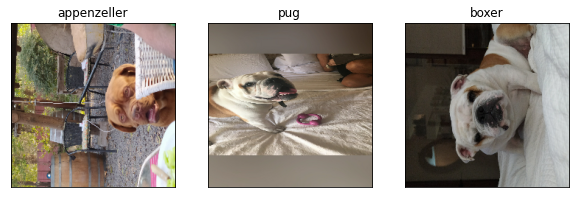

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)